# 1. Explore this dataset using what you have learned in data preprocessing and data visualization 

### Importing the dataset and showing the head of the dataset

In [58]:
import pandas as pd
df=pd.read_csv(r"C:\Users\LAOUEDJ Said\Desktop\AI\Checkpoint\Checkpoint4\kc_house_data.csv", sep = ',')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [59]:
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  int64  
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

# 2. Write a paragraph selecting the most important features (feature selection). 


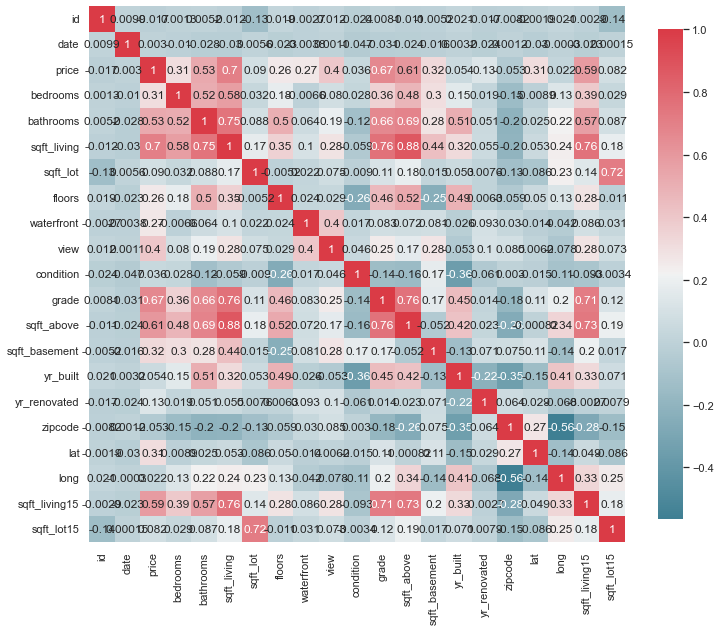

In [60]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns; sns.set_theme()

def plot_correlation_map(df):
    corr=df.corr()
    s,ax=plt.subplots(figsize=(12,10))
    cmap=sns.diverging_palette(220,10,as_cmap=True)
    s=sns.heatmap(corr,cmap=cmap,square=True,cbar_kws={'shrink':.9},ax=ax,annot=True,annot_kws={'fontsize':12})
plot_correlation_map(df)    

In [43]:
#The selection of inputs x is based on mapheat above, we can detect the useless columns colored by blue:
#( 'id','date','sqft_lot','condition','yr_renovated','floors','zipcode','long','sqft_lot15')

In [61]:
df.drop(['id','date','sqft_lot','condition','yr_renovated','sqft_basement','floors','zipcode','long','sqft_lot15'], axis=1, inplace=True)
df

,price,bedrooms,bathrooms,sqft_living,waterfront,view,grade,sqft_above,yr_built,lat,sqft_living15
0,221900.0,3,1.00,1180,0,0,7,1180,1955,47.5112,1340
1,538000.0,3,2.25,2570,0,0,7,2170,1951,47.7210,1690
2,180000.0,2,1.00,770,0,0,6,770,1933,47.7379,2720
3,604000.0,4,3.00,1960,0,0,7,1050,1965,47.5208,1360
4,510000.0,3,2.00,1680,0,0,8,1680,1987,47.6168,1800
...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,0,0,8,1530,2009,47.6993,1530
21609,400000.0,4,2.50,2310,0,0,8,2310,2014,47.5107,1830
21610,402101.0,2,0.75,1020,0,0,7,1020,2009,47.5944,1020
21611,400000.0,3,2.50,1600,0,0,8,1600,2004,47.5345,1410


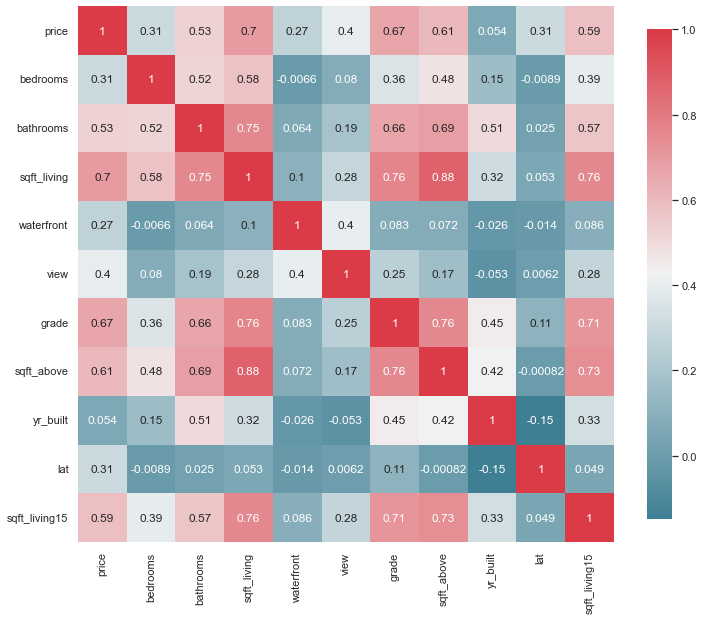

In [62]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns; sns.set_theme()

def plot_correlation_map(df):
    corr=df.corr()
    s,ax=plt.subplots(figsize=(12,10))
    cmap=sns.diverging_palette(220,10,as_cmap=True)
    s=sns.heatmap(corr,cmap=cmap,square=True,cbar_kws={'shrink':.9},ax=ax,annot=True,annot_kws={'fontsize':12})
plot_correlation_map(df)    

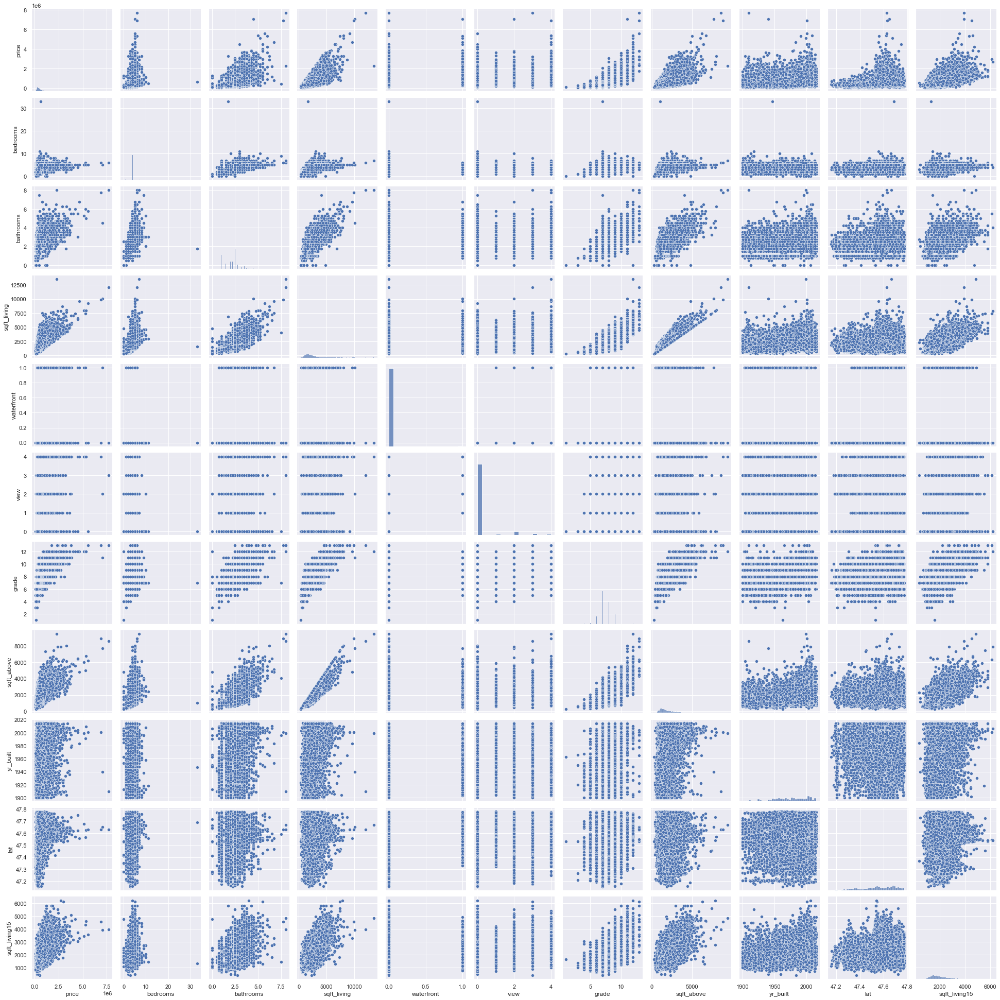

In [63]:
import pandas as pd
import seaborn as sns
sns.pairplot(df)

In [64]:
# Here we detect two outlers but they don't matter so we keep them

import plotly.graph_objects as go

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['bathrooms'], y=df['price'],
                    mode='markers',
                    name='bathrooms'))
fig.add_trace(go.Scatter(x=df['bedrooms'], y=df['price'],
                    mode='markers',
                    name='bedrooms'))
fig.add_trace(go.Scatter(x=df['sqft_living'], y=df['price'],
                    mode='markers',
                    name='sqft_living'))
fig.add_trace(go.Scatter(x=df['waterfront'], y=df['price'],
                    mode='markers',
                    name='waterfront'))
fig.add_trace(go.Scatter(x=df['view'], y=df['price'],
                    mode='markers',
                    name='view'))
fig.add_trace(go.Scatter(x=df['grade'], y=df['price'],
                    mode='markers',
                    name='grade'))
fig.add_trace(go.Scatter(x=df['sqft_above'], y=df['price'],
                    mode='markers',
                    name='sqft_above'))
fig.add_trace(go.Scatter(x=df['yr_built'], y=df['price'],
                    mode='markers',
                    name='yr_built'))
fig.add_trace(go.Scatter(x=df['lat'], y=df['price'],
                    mode='markers',
                    name='lat'))
fig.add_trace(go.Scatter(x=df['sqft_living15'], y=df['price'],
                    mode='markers',
                    name='sqft_living15'))
fig.show()

# 1_ Linear Regression 

In [ ]:
# For linear regression we should select only one input x, after analyse the heatmap we find that x=sqtf_living
# is adequat as input for this type of regression

In [65]:
#Importing libraries import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_squared_error 
from sklearn import metrics 

#extract x and y from our data 
x=df["sqft_living"].values[:,np.newaxis] 
y=df["price"].values
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.8,random_state=40) #splitting data with test size of 35% 
model=LinearRegression() #build linear regression model 
model.fit(x_train,y_train) #fitting the training data
predicted=model.predict(x_test) #testing our model’s performance
print("MSE", mean_squared_error(y_test,predicted))
print("R squared", metrics.r2_score(y_test,predicted)) 

MSE 67708855284.12373
R squared 0.4988188064393997


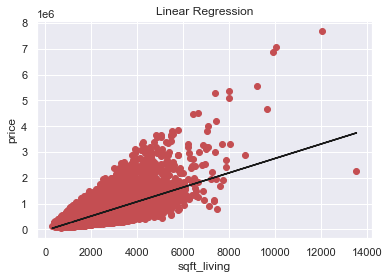

In [66]:
plt.scatter(x,y,color="r")
plt.title("Linear Regression")
plt.ylabel("price")
plt.xlabel("sqft_living") 
plt.plot(x,model.predict(x),color="k") 
plt.show() 

 # 2_ Apply multiple-linear regression and compare it to the linear model. 


 ### Case2 : Selection of input x is based on mapheat we drop useless columns 
### ['id','date','sqft_lot','condition','yr_renovated','sqft_basement','floors','zipcode','long','sqft_lot15']

In [67]:
#Use all input X - ['price','id','date','sqft_lot','condition','yr_renovated','sqft_basement','floors','zipcode','long','sqft_lot15']

#Importing libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics



#Multiple-Linear Regression Code
#extract x and y from our data 

x=df.drop(columns=['price']).values

y=df["price"].values

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.80,random_state=40) #splitting data with test size of 80%

model=LinearRegression() #build linear regression model
model.fit(x_train,y_train) #fitting the training data
predicted=model.predict(x_test) #testing our model’s performance

print("MSE", mean_squared_error(y_test,predicted))
print("R squared", metrics.r2_score(y_test,predicted))

MSE 41678121957.55816
R squared 0.6914983893849537


# Applying polynomial Regression


In [68]:
#Importing libraries 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.metrics import mean_squared_error
from sklearn import metrics 


x=df.drop(columns=['price']).values
y=df["price"].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.80, random_state=40) #splitting data 
lg=LinearRegression()
poly=PolynomialFeatures(degree=2) 

x_train_fit = poly.fit_transform(x_train) #transforming our input data
lg.fit(x_train_fit, y_train)
x_test_ = poly.fit_transform(x_test)
predicted = lg.predict(x_test_) 

print("MSE: ", metrics.mean_squared_error(y_test, predicted)) 
print("R squared: ", metrics.r2_score(y_test,predicted)) 

MSE:  31479000309.09149
R squared:  0.7669923249949808
